<a href="https://colab.research.google.com/github/JoumanaMaki/Face-Detection/blob/main/FaceDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# OpenCV

### Load Image

In [ ]:
import cv2

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')

In [ ]:
image.shape
#(1280: height, 1920:width, 3: 3 channels rgb)

(1280, 1920, 3)

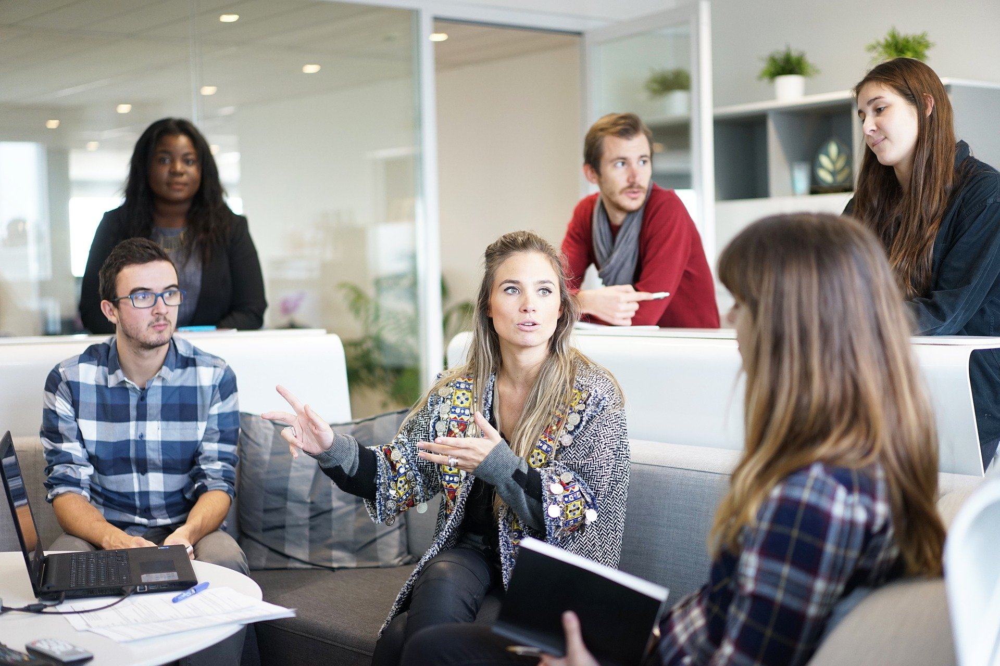

In [ ]:
#cv2.imshow(image)
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [ ]:
#resize the image to let the detecter be faster
image= cv2.resize(image, (800,600))

In [ ]:
image.shape

(600, 800, 3)

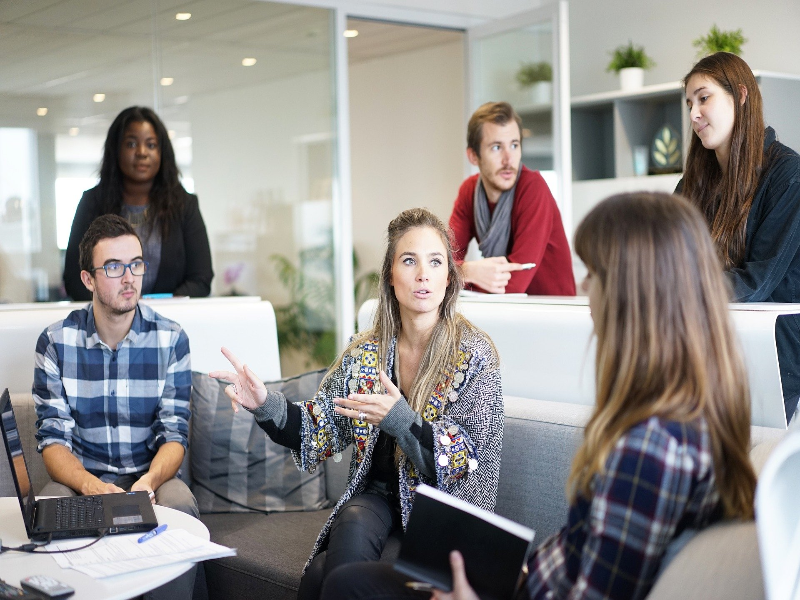

In [ ]:
cv2_imshow(image)

In [ ]:
600*800 *3, 600*800, 1440000 -480000

(1440000, 480000, 960000)

### Convert the colored image to a grayscale image to make it smaller, thus requires less time when using the cascading classifier

In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

array([[109, 111, 111, ..., 191, 191, 191],
       [114, 114, 115, ..., 191, 191, 190],
       [121, 116, 128, ..., 192, 193, 192],
       ...,
       [ 39,  41,  41, ..., 247, 247, 246],
       [ 40,  38,  40, ..., 247, 247, 246],
       [ 47,  39,  44, ..., 246, 247, 247]], dtype=uint8)
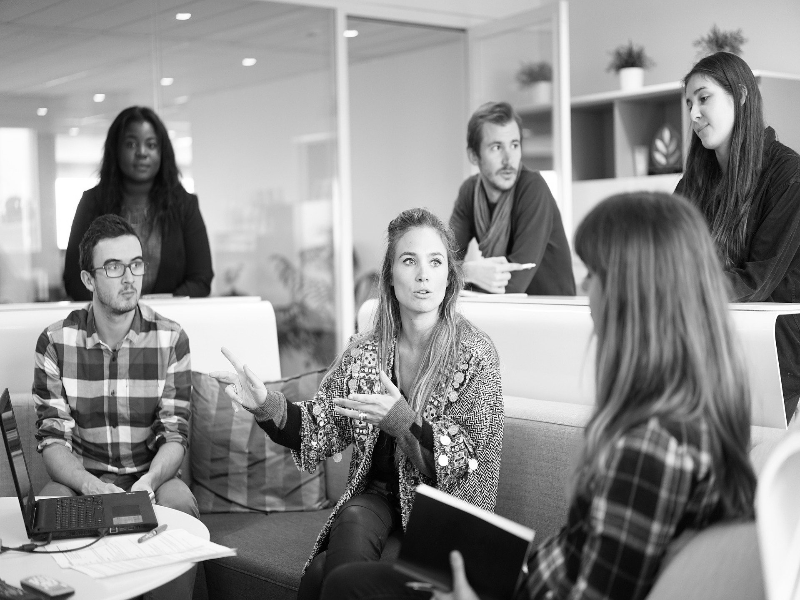

In [ ]:
image_gray

In [ ]:


image.shape, image_gray.shape

((600, 800, 3), (600, 800))

#Face Detection

Load Face detector


In [ ]:
#trained file that can we use in order to detect faces
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [ ]:
detections = face_detector.detectMultiScale(image_gray)

In [ ]:
detections
#each row indicates a face that is detected
# position of x:677 y:72 size:  68*68

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [ ]:
len(detections) #nb of faces #just front faces in the image why?: bcz the detector is only for the front faces

6

677 72 68 68
115 124 53 53
475 123 59 59
387 233 73 73
92 239 66 66
390 323 56 56


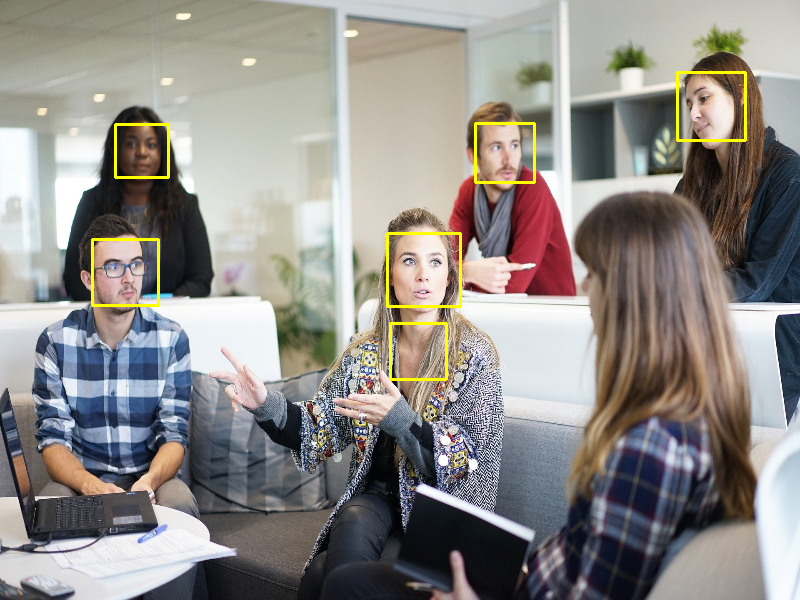

In [ ]:
for(x, y, w, h) in detections:
  print(x,y,w,h)
  #cv2.rectangle(image, (x,y), (x,y) ,(0,255,0), 2)
  #cv2.rectangle(image, (x,y), (x+w,y+h) ,(0,255,255), 5)
  cv2.rectangle(image, (x,y), (x+w,y+h) ,(0,255,255), 2)
cv2_imshow(image)

array([[[ 97, 109, 113],
        [ 97, 112, 115],
        [ 97, 112, 116],
        ...,
        [186, 191, 192],
        [186, 191, 192],
        [186, 191, 192]],

       [[100, 115, 117],
        [100, 115, 118],
        [100, 116, 119],
        ...,
        [186, 191, 192],
        [186, 191, 193],
        [185, 190, 191]],

       [[107, 122, 125],
        [102, 117, 120],
        [113, 129, 132],
        ...,
        [187, 192, 193],
        [188, 193, 194],
        [187, 192, 193]],

       ...,

       [[ 43,  39,  38],
        [ 45,  41,  39],
        [ 45,  40,  40],
        ...,
        [251, 248, 242],
        [251, 248, 244],
        [252, 246, 243]],

       [[ 45,  40,  37],
        [ 43,  38,  35],
        [ 45,  40,  38],
        ...,
        [251, 248, 243],
        [251, 248, 244],
        [251, 246, 243]],

       [[ 54,  48,  43],
        [ 46,  40,  35],
        [ 51,  44,  41],
        ...,
        [249, 247, 242],
        [251, 248, 244],
        [252, 247, 244]]], dtype=uint8)
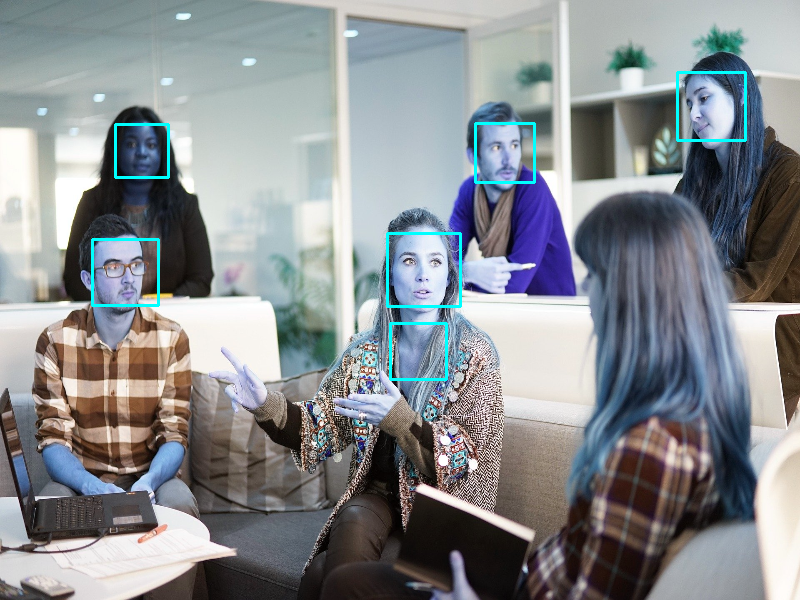

In [ ]:
cv2.rectangle(image, (x,y), (x+w,y+h) ,(0,255,255), 2)

#Haarcascade Parameters

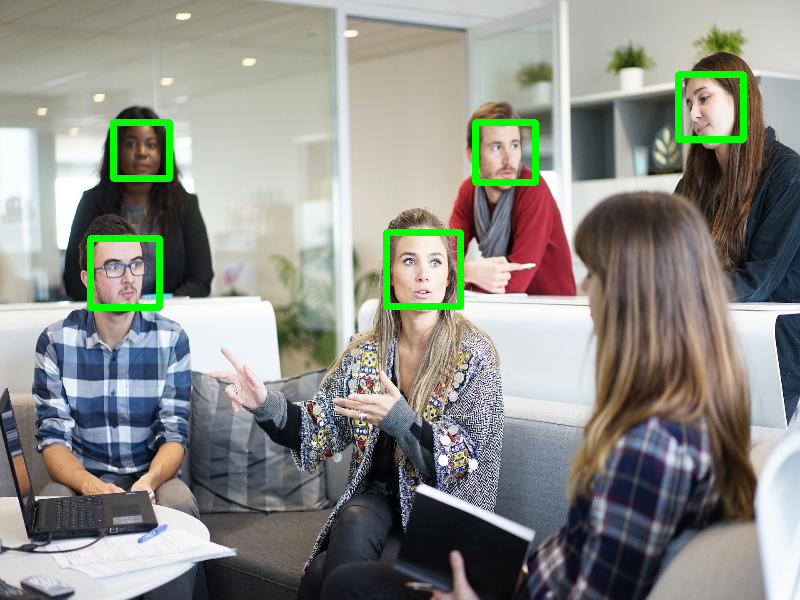

In [ ]:
#SCALE FACTOR TO ELIMINATE THE FALSE POSITIVE
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#scaleFactor should be small when we have only small faces
# if scale of image is high , we set a high nb
#it is necessary to do several tests to see the right parameter
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 5)
cv2_imshow(image)

47 47
47 47
49 49
49 49
52 52
51 51
46 46
44 44
51 51
50 50
51 51
47 47


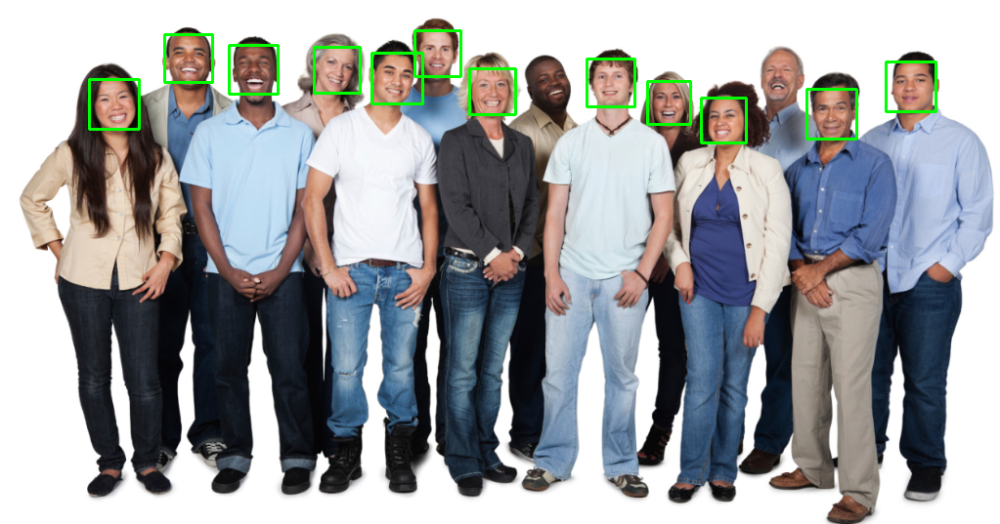

In [ ]:
#Scale Factor is not enough
#MinNegihbors: the higehr the value, the higher the quality of detections is ( no false positive)
#Min Size for the face
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.2, minNeighbors=7, minSize=(10,10), maxSize=(100,100)) #minsize and maxsize are w and h
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

##Cars detection


In [ ]:
import cv2

image= cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/car.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

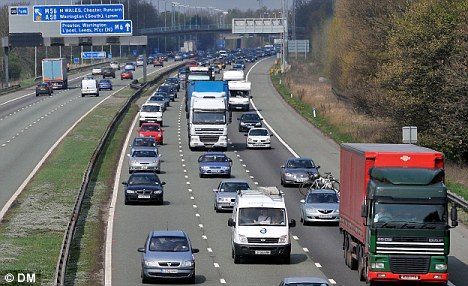

In [ ]:
cv2_imshow(image)

In [ ]:
car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/cars.xml')

32 32
35 35
46 46
46 46
81 81
32 32
53 53
84 84


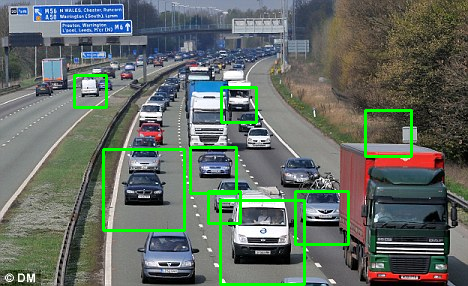

In [ ]:
detections =  car_detector.detectMultiScale(image_gray, scaleFactor = 1.03, minNeighbors = 5)
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

#Eyes Detection

In [ ]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')

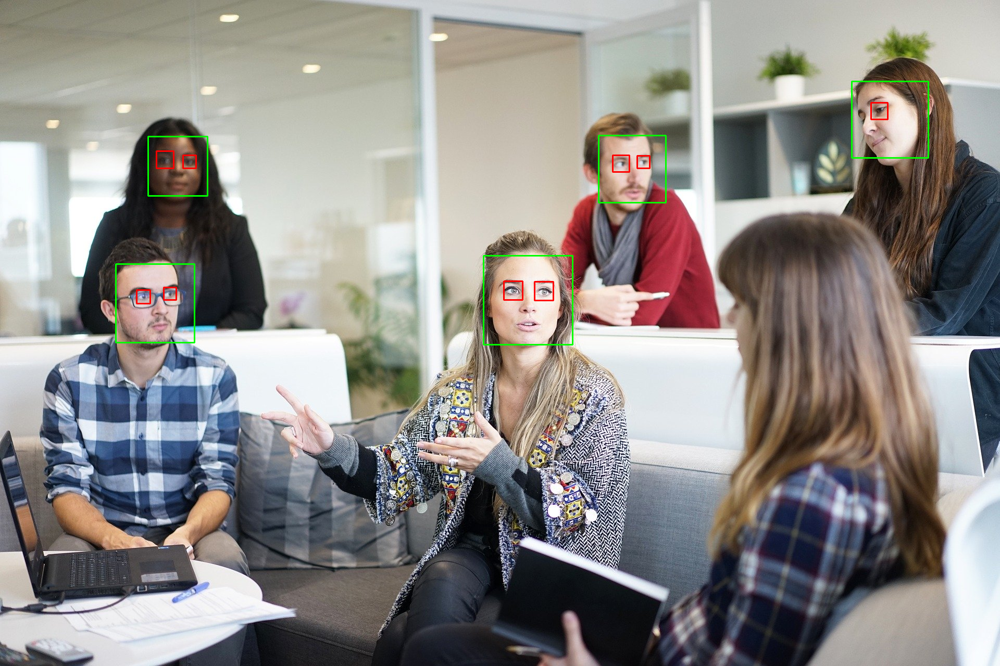

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')
# image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#scaleFactor should be small when we have only small faces
# if scale of image is high , we set a high nb
#it is necessary to do several tests to see the right parameter
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize=(30,30))
eye_detections = eye_detector.detectMultiScale(image_gray,scaleFactor = 1.1, minNeighbors= 10, maxSize=(45,45))
for (x,y,w,h) in eye_detections:
    print(x,y,w,h)
    cv2.rectangle(image, (x,y), (x+w, y+h), (0,0,255), 2)
for (x, y, w, h) in detections:
  print(x,y,w,h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

# Clock Detection


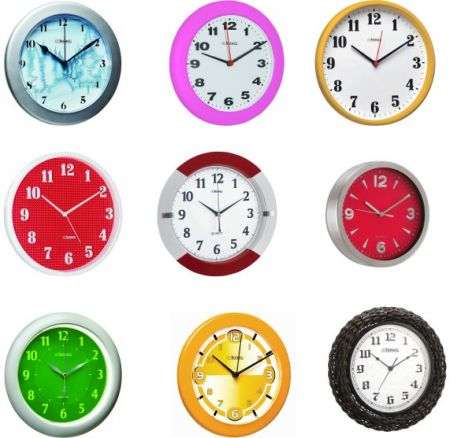

In [ ]:
clock_image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/clock.jpg')
clock_image_gray = cv2.cvtColor(clock_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(clock_image)

In [ ]:
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/clocks.xml')

103 103
98 98
104 104
91 91
93 93
70 70
99 99


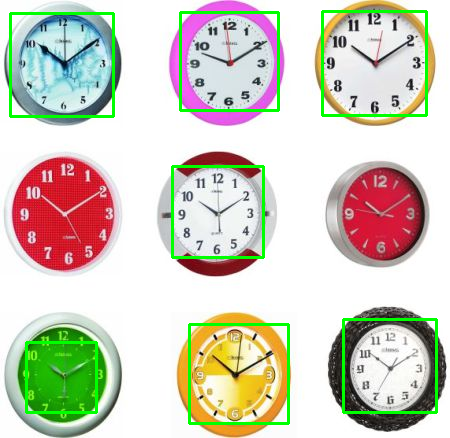

In [ ]:
detections = clock_detector.detectMultiScale(clock_image_gray, scaleFactor = 1.03, minNeighbors=1 )
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(clock_image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(clock_image)

#Full Body

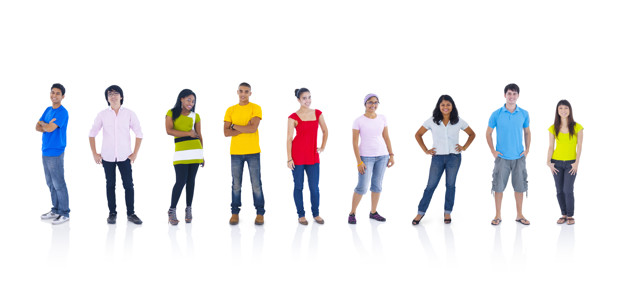

In [ ]:
full_body_image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
image_gray = cv2.cvtColor(full_body_image, cv2.COLOR_BGR2GRAY)
cv2_imshow(full_body_image)

In [ ]:
full_body_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/fullbody.xml')

88 176
96 192
76 153
91 182
75 149
63 126
86 171
90 178


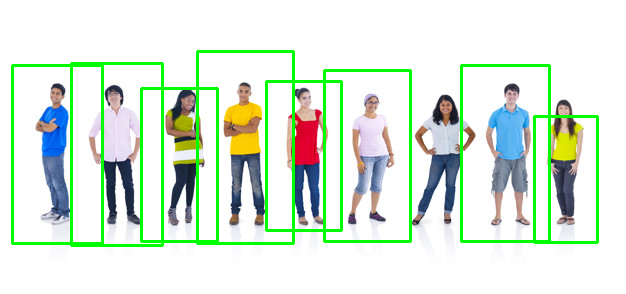

In [ ]:
detections = full_body_detector.detectMultiScale(image_gray, scaleFactor = 1.09, minNeighbors=2, minSize=(50,50) )
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(full_body_image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(full_body_image)

#Dlib

In [ ]:
import dlib

### Detecting faces with HOG

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')

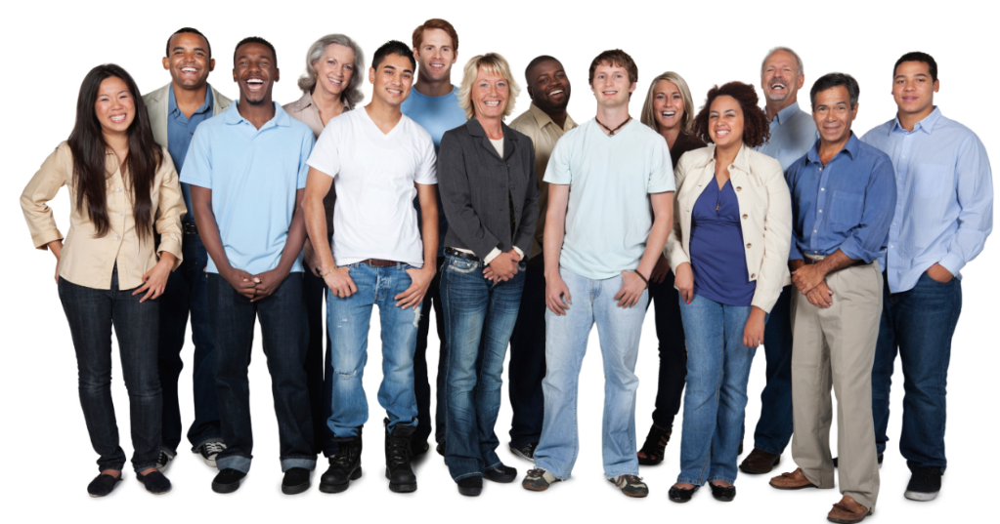

In [ ]:
cv2_imshow(image)

In [ ]:
face_detector_hog = dlib.get_frontal_face_detector()

In [ ]:
detections = face_detector_hog(image, 1) #no need to convert image to grayscale to have better results
# the second argument indicates the scale of the image and  is similar to scaleFactor

In [ ]:
detections , len(detections)

(rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]],
 14)

[(429, 38) (465, 74)]
429
38
465
74
[(665, 90) (701, 126)]
665
90
701
126
[(717, 103) (760, 146)]
717
103
760
146
[(909, 70) (952, 113)]
909
70
952
113
[(828, 98) (871, 142)]
828
98
871
142
[(605, 70) (641, 106)]
605
70
641
106
[(777, 62) (813, 98)]
777
62
813
98
[(485, 78) (521, 114)]
485
78
521
114
[(386, 60) (429, 103)]
386
60
429
103
[(170, 41) (213, 84)]
170
41
213
84
[(93, 89) (136, 132)]
93
89
136
132
[(237, 50) (280, 94)]
237
50
280
94
[(323, 50) (367, 94)]
323
50
367
94
[(544, 65) (588, 108)]
544
65
588
108


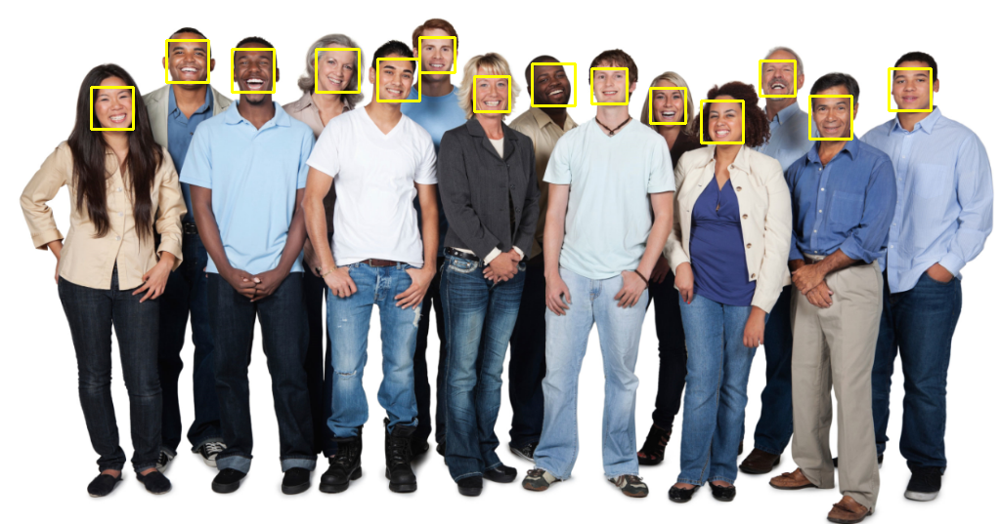

In [ ]:
for face in detections:
  print(face)
  print(face.left())
  print(face.top())
  print(face.right()),
  print(face.bottom())
  l,t,r,b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l,t), (r, b), (0,255,255), 2)
cv2_imshow(image)

#CNN

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')

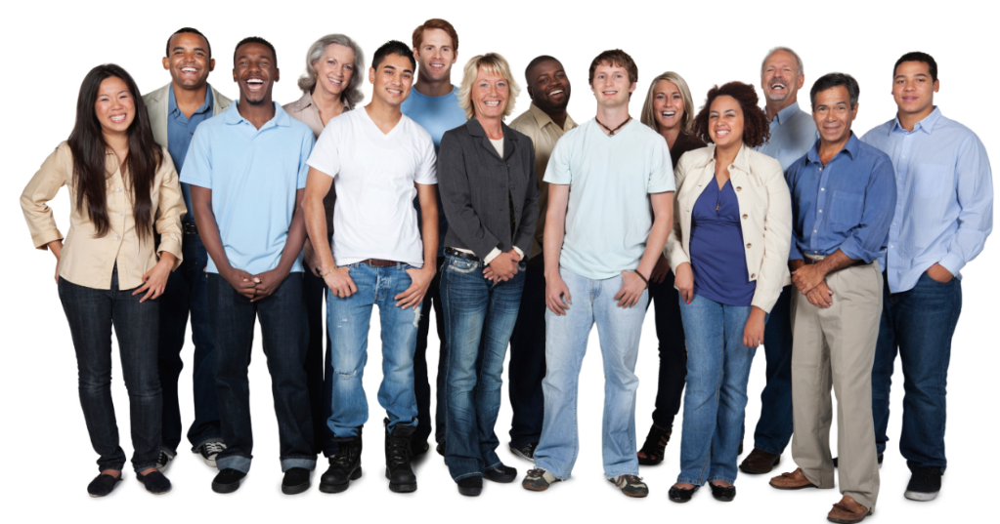

In [ ]:
cv2_imshow(image)

In [ ]:
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')

721
105
760
145
0.8642512559890747
476
71
524
118
1.1222339868545532
425
37
464
77
1.0843313932418823
601
65
640
105
1.0815783739089966
665
85
704
125
1.06605064868927
321
49
360
89
1.0506608486175537
381
61
420
101
1.0491536855697632
909
69
948
109
1.0487682819366455
829
97
868
137
1.0434502363204956
169
37
216
84
0.975801944732666
773
57
812
97
0.918718695640564
236
47
284
94
0.9098364114761353
93
89
132
129
0.8634318113327026


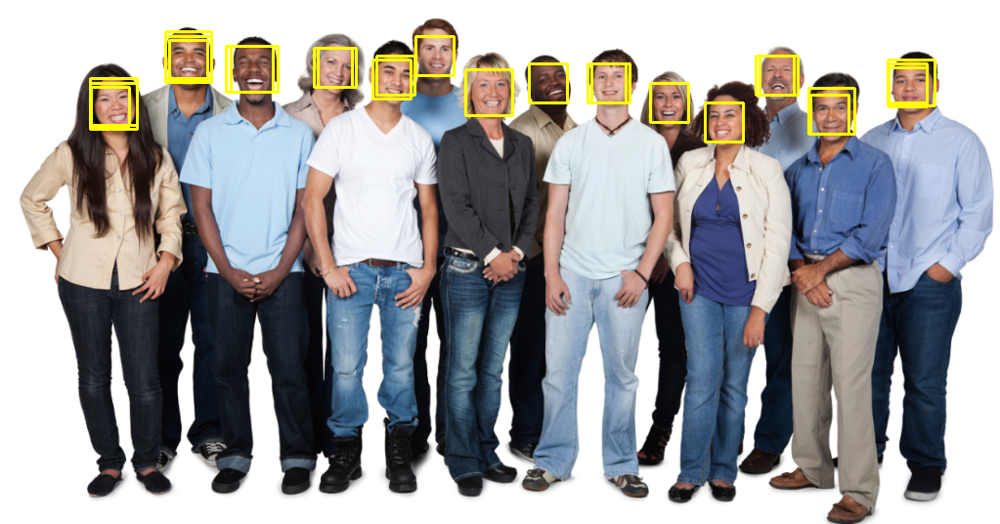

In [ ]:
detections = cnn_detector(image, 1)
for face in detections:
  print(face.rect.left())
  print(face.rect.top())
  print(face.rect.right())
  print(face.rect.bottom())
  print(c)
  l,t,r,b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  cv2.rectangle(image, (l,t), (r, b), (0,255,255), 2)
cv2_imshow(image)

In [ ]:
!apt-get install -y cmake
!pip install dlib


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
cmake is already the newest version (3.22.1-1ubuntu1.22.04.2).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


#Comparison

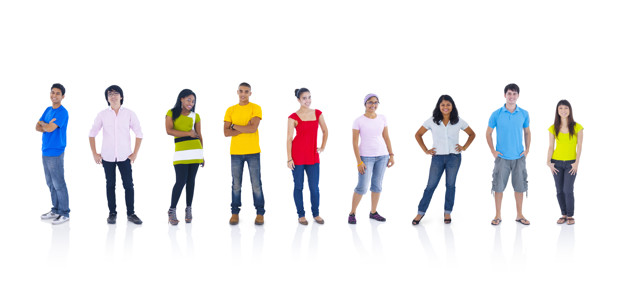

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people3.jpg')
cv2_imshow(image)

###Haarcascade

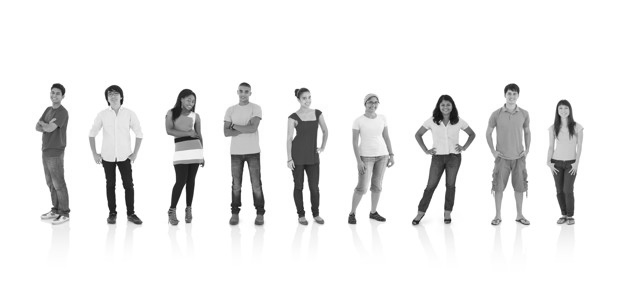

In [ ]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

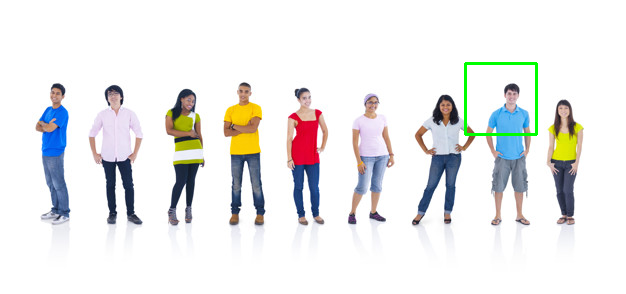

In [ ]:
haarcascade_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = haarcascade_detector.detectMultiScale(image_gray, scaleFactor = 1.001, minNeighbors=5, minSize = (5,5))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

### HOG

[(438, 100) (451, 113)]
438
100
451
113
[(505, 89) (518, 103)]
505
89
518
103
[(47, 88) (60, 101)]
47
88
60
101
[(299, 92) (312, 106)]
299
92
312
106
[(182, 95) (196, 109)]
182
95
196
109


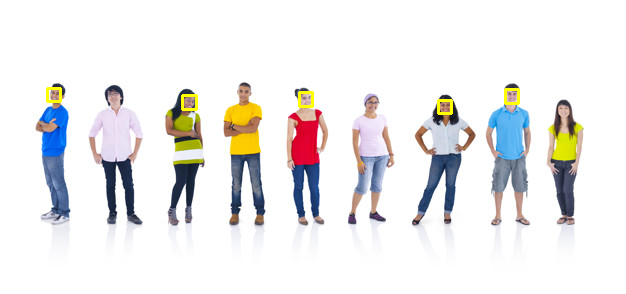

In [ ]:
import dlib
face_detector_hog = dlib.get_frontal_face_detector()
detections = face_detector_hog(image, 4)
for face in detections:
  print(face)
  print(face.left())
  print(face.top())
  print(face.right()),
  print(face.bottom())
  l,t,r,b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l,t), (r, b), (0,255,255), 2)
cv2_imshow(image)

###CNN

In [ ]:
face_detector_cnn = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')


557
103
569
115


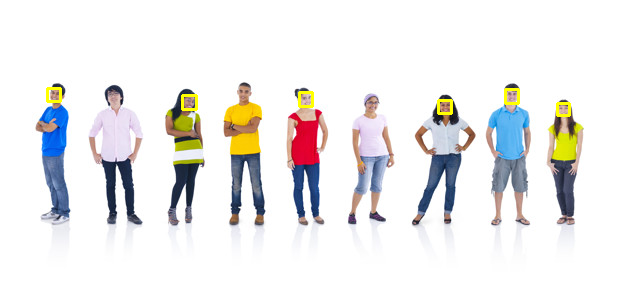

In [ ]:
detections = face_detector_cnn(image, 4)
for face in detections:
  print(face.rect.left())
  print(face.rect.top())
  print(face.rect.right())
  print(face.rect.bottom())
  l,t,r,b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  cv2.rectangle(image, (l,t), (r, b), (0,255,255), 2)
cv2_imshow(image)